# Scientific Paper Template (Jupyter Notebook) - Edit this title

* **Authors:** Oscar Chivers

* **Student ID:** 190012624

* **Date:** 04/04/24

**Abstract:**

[Write a concise summary of your research here.]

**Keywords:** [List relevant keywords here.]

# GitHub Repository
- **GitHub Link:** https://github.com/OscarChivers/UA_Final

- **Google Drive Link for data:**

## Declaration

> In submitting this assignment, I hereby confirm that I have read the University's statement on Good Academic Practice. The following work is my own. Significant academic debts and borrowings have been properly acknowledged and referenced.


The data that is needed for the lab has been uploaded to the GitHub repo, but it has also been put in a google drive. If you choose to use the data from the GitHub, if you put the data in a folder called 'data', then you should not need to change the file paths in the workboom. If you choose to download the data with the google drive, please click on the google drive link, and all the data needed for this lab is in there. You will need to download them to a file and then run the code. You may have to change the paths when calling the files but if you put the data in a file with the following path 'data' then you should not need to do this.

Some of the maps that are coded do not come up in the printed version. However when you run the code they will appear. Regardless, the maps that are the final maps are all pasted as images so they will be present.

**Table of Contents:** 

* Section 1
* Section 2
* Section n


## Introduction

Provide a clear introduction to your research, outlining the problem you're addressing,  the research question, its significance, and relevant background information. Include citations using appropriate formatting (e.g., BibTeX, Markdown footnotes).re of 


## Methodology

Describe the methods used in your research, including data sources, collection procedures, analysis techniques, and any relevant software tools. Include code cells for data loading, preprocessing, and key steps in your analysis pipeline.


In [1]:
# Import necessary libraries for your project
import numpy as np
import pandas as pd
import geopandas as gpd

import folium
from folium import plugins
from folium.plugins import MeasureControl
from branca.colormap import linear
from branca import colormap
from branca import colormap as cm

import warnings
warnings.simplefilter('ignore', DeprecationWarning)
warnings.filterwarnings('ignore')

import networkx as nx

import matplotlib.pyplot as plt

import osmnx as ox
from IPython.display import Image

import seaborn as sns

# Placeholder code for data loading and preprocessing - If the code is too large, make use of appendix
# section, describing clearly where the code is located to reproduce any map, figure, final results
# and workflow you need to include
# ...


This research project used various research methods for data collection, analysis and presentation. The following sections will show the data that was downloaded, and processed through code and markdown cells. 

### Data Download

The road and cycle networks of Cambridge were extracted using the OSMnx package in python. OSMnx can download street networks from anywhere in the world using open street maps. OSMnx downloads information regarding the nodes and edges of the street network. When the Cambridge road network was initially downloaded, there were over 3,000 nodes in the Cambridge street network, which was far too many to run analysis on as commands would take far too long to be processed and many of the nodes overlapped. This made it hard to determine which node the crash actually took place in. Therefore, a code was adapted from Geoff Boeing, the developer of OSMnx package (GitHub, 2024) to clean up the nodes that are in intersections within a 15 metre buffer of each other, it will also remove the dead ends but keep the overall shape of the graph. After this, there were only 1,665 nodes in the graph which made the analysis much smoother. A second OSMnx network was downloaded, which was the cycle network of Cambridge. This also required some cleaning to select the edges which were just the cycle lanes. 

In [2]:
#Load Cambridge Drive Network
C_drive = ox.graph_from_place("Cambridge, UK", network_type="drive")

# get a GeoSeries of consolidated intersections
G_proj = ox.project_graph(C_drive)
G2 = ox.consolidate_intersections(G_proj, rebuild_graph=True, tolerance=15, dead_ends=False)

#select nodes from this graph and make a GDF
nodes = ox.graph_to_gdfs(G2, edges=False)


#Load Cambridge Bike Network 
C_bike = ox.graph_from_place("Cambridge, UK", network_type="bike")

#select edges from this graph and make a GDF so I can then select the bike paths
edges = ox.graph_to_gdfs(C_bike, nodes=False)

#Select just bike paths
cycle_path = edges[edges['highway'] == 'cycleway']


A dataset containing locations of car accidents and some information about the type of accident was downloaded from the Cambridgeshire and Peterborough Open Data Portal (Cambridgeshire Insight, n.d.). Crashes from 2017 and 2018 were downloaded as separate datasets and bound together. Before cleaning of variables and checking for null values. The dataset also had to be clipped by extent to just the City of Cambridge, rather than Cambridgeshire. This was done using a shapefile with the City of Cambridge boundary that was already downloaded on this hard drive. 

In [3]:
#load in Crashes dataset and subset the variables that are of interest 
crashes = pd.read_csv("data/Final/RTC Location 2018.csv")
subset_crashes = crashes[['Date', 'Police_ref', 'Easting', 'Northing', 'Severity', 'Casualties', 'Pedestrian', 'Cycles',
                          'Road_Type', 'Speed_Lim', 'Junct_det', 'Weather', 'Day', 'Local_Auth'
                         ]]

#load in 2017 crasg datset and subset variables of interest 
crashes_2017 = pd.read_csv("data/Final/RTC Location 2017.csv")
crashes_2017_sub = crashes_2017[['Date', 'Police_ref', 'Easting', 'Northing', 'Severity', 'Casualties', 'Pedestrian', 'Cycles',
                          'Road_Type', 'Speed_Lim', 'Junct_det', 'Weather', 'Day', 'Local_Auth'
                         ]]

#bind the two dataframes 
merged_df = pd.concat([subset_crashes, crashes_2017_sub])

#check for NAs 
nan_easting = merged_df['Easting'].isna().sum()
nan_northing = merged_df['Northing'].isna().sum()

#make the geodataframe with projected crs as my data is in easting and northing 
geometry = gpd.points_from_xy(merged_df['Easting'], merged_df['Northing'])
gdf = gpd.GeoDataFrame(merged_df, crs="EPSG:27700", geometry=geometry)

#load dataframe border 
border = gpd.read_file('data/Final/cambs_and_southCambs.shp')

#Select the border of just the City of Cambridge from the shapefile 
city = border[border['ltla22nm'] == 'Cambridge']

#Select only the crashes that are within the city - name the dataframe city_crash
city_single = city.unary_union 
city_crash = gdf[gdf.intersects(city_single)] 

Another dataset was downloaded from UK Government website displaying the Index of Multiple Deprivation (IMD) rank for all LSOA areas in England. This was clipped by extent to the Cambridge LSOA which was already downloaded on this hard drive. 

In [4]:
#Download shapefile of LSOA 
LSOA_gdf = gpd.read_file("data/Final/england_lsoa_2011.shp")

#Clip the extent of LSOAs to just City of Cambridge 
LSOA_clipped = gpd.clip(LSOA_gdf, city.geometry)

#Load IMD data 
IMD_data = pd.read_csv("data/Final/IMD_data.csv")

#Merge IMD data with LSOA extent 
cambs_IMD = pd.merge(LSOA_clipped, IMD_data,  left_on="code", right_on="LSOA code (2011)")

#Clean up gdf
cambs_IMD = cambs_IMD.drop(columns=['label', 'LSOA code (2011)', 'LSOA name (2011)', 'Local Authority District code (2019)',
                                   'Index of Multiple Deprivation (IMD) Rank'])

cambs_IMD = cambs_IMD.rename(columns={'Index of Multiple Deprivation (IMD) Decile': 'IMD_rank'})

cambs_IMD = cambs_IMD.drop(cambs_IMD.index[:3]) # dropped first 3 columns because they were outside the local authority 

Finally, the dataset containing counts of car or van availability was downloaded from Nomis (Nomis, n.d.). This was taken from the 2011 census data. There was cleaning up and some of the data had to be converted to percentages rather than counts so that the data was not skewed.  

In [5]:
#read in csv 
car_data = pd.read_csv("data/Final/cambs_car.csv")

#clean data
keep_cols = [
    "geography code",
    "Cars: All categories: Car or van availability; measures: Value",
    "Cars: No cars or vans in household; measures: Value",
    "Cars: sum of All cars or vans in the area; measures: Value"
]
car_data_cliped = car_data[keep_cols]

#bind data to cambs IMD dataset 
cambs_IMD_car = pd.merge(cambs_IMD, car_data_cliped,  left_on="code", right_on="geography code")

#make some variables into a percentage: 
cambs_IMD_car['no_car_perc'] = (cambs_IMD_car['Cars: No cars or vans in household; measures: Value']/
                                cambs_IMD_car['Cars: All categories: Car or van availability; measures: Value'])*100

A folium map was produced, however to do this there had to be data processing. Folium only works with coordinates in latitude and longitudes, therefore these had to be changed from the city_crash gdf. 

In [6]:
#Make a copy of city_crash - so that the original dataframe is not changed, nor are the geometries.
folium_df = city_crash.copy()

#change geometries
folium_df = folium_df.to_crs('EPSG:4326')

#extract the latitude and longitude values from the geometries
folium_df['longitude'] = folium_df.geometry.x
folium_df['latitude'] = folium_df.geometry.y

### Methods of analysis 

This section will explain the main methods of analysis used, alongside key pipeline code needed for the analysis and results section. 

One key method that was used was betweenness centrality calculations of the street network nodes. This was done using the NetworkX package on python. The betweenness centrality was important as it identified the key nodes in the Cambridge driving network which are used in the shortest route when trying to get from one place to another. The betweenness centrality measures were categorised into 5 categories, based on their connectivity value and added to the dataset. A buffer was created around these nodes of 25 metres, this value was obtained from trail and error. Then, a point in polygon analysis was conducted. This determined the number of crashes that took place in each 25m buffer. 

In [7]:
#The code in this cell takes a long time to run, please be patient with this cell. 

#betweenness centrality measures to make the histogram for categorisation 
b_centrality = nx.betweenness_centrality(G2, weight="length")
#weight is given to length to give long edges more strength

#make an attribute 
nx.set_node_attributes(G2, b_centrality, name="bc")
nodes = ox.graph_to_gdfs(G2, edges=False)

#function that applies an if statement to make a new category in the dataframe showing a categorical value of  betweeness centrality
def betweeness_cent(row):
   if row['bc'] == 0:
      return 'Not connected'
   elif 0 < row['bc'] <= 0.05:
      return 'Low Connectivity'
   elif 0.05 < row['bc'] <= 0.1:
       return 'Med Connectivity'
   elif 0.1 < row['bc'] <= 0.2:
       return 'High Connectivity'
   else:
      return 'Extreme Connectivity'

#applying the function to my dataframe
nodes.apply(betweeness_cent, axis=1)

#adding the applied function 
nodes['bc_category'] = nodes.apply(betweeness_cent, axis=1)

#change crs
nodes = nodes.to_crs('EPSG:27700')

#make copy 
nodes_copy = nodes.copy()

#make buffer of 25m 
nodes_copy['geometry'] = nodes_copy.geometry.buffer(25)

#PIP analysis
crashes_w_buffer =  city_crash.sjoin(nodes_copy, how="inner", predicate='intersects')

A similar NetworkX data manipulation method was to locate where there were bike crashes in a bike lane. To do this, first the crashes which were only with bikes had to be selected from the city_crash dataframe. Then a copy was made to make geometry changes and a buffer of 15 metres was made around the bike lanes. Then crashes that were within the bike lanes were extracted and added to the bike_crash dataframe as a Boolean value. 

In [8]:
#Select only crashes between bikes and cars
bike_crash = city_crash[city_crash['Cycles'] > 0]

#changing crs of bike_crash so that the buffer will work (needs to be in metres not degrees)
cycle_path = cycle_path.to_crs('EPSG:27700')

#Making a copy before making buffer and changing geometries
cycle_path_copy = cycle_path.copy()
cycle_path_copy['geometry'] = cycle_path_copy.geometry.buffer(15)

#make boolean variable if the crash happened in a bike lane
cycle_single = cycle_path_copy.unary_union  #merges bike lanes to a single object
bike_crash['Inside_Cycle_Lane'] = bike_crash.intersects(cycle_single) # Select the  points data that intersect with bike lanes

Throughout the process, maps were used to display the spatial variation in crashes throughout Cambridge. For example, this was used to show the if there were differences between the number of crashes in each LSOA ward. Explore maps are an important part of this analysis because it presents a unique opportunity for the reader to corroborate the findings of this report and see for themselves where many of the crashes took place. 

 Descriptive statistics were used as an important part of the methodology, they were used to support the maps shown and to provide some important reasons as to why there is spatial variation in the crashes in Cambridge. Different types of descriptive statistics were used in the results section of this report. Both univariate and bivariate descriptive statistics were used in the forms of box plots, bar charts, scatterplots and cross tabulations. These different types of descriptive statistics were used because of the nature of the data: some data were categorical and others were continuous. 

Finally, it was important to use some socio-economic analysis methods in the report. Since all of the other analysis techniques had focussed on just car crashes or bike and car crashes, it was important to try and relate this to other data about Cambridge. The benefit of this is that it will determine if there may be some other reason for the spatial variation in these crashes. Clearly, only two socio-economic indicators are used in this report, due to the time constraints of the project. Therefore it is likely that there are other reasons of the spatial variation of crashes that require research. This research will determine if there is a correlation between IMD and car accidents and also if access to car is correlated to car accidents. This will be done by using a point in polygon analysis, then using the groupby feature in the pandas package to determine if there are more crashes in areas with certain features in Cambridge – such as IMD or access to a car. 

All key pipeline analysis code for the rest of the project is in the following cells of the methodology section. Therefore the results section should have little to no analysis code necessary. 


In [9]:
#Code Pipeline to Make BarChart for number of crashes per connectivity category:

#Group crashes by betweenness centrality category
crashes_per_category = crashes_w_buffer.groupby('bc_category').size().reset_index(name='total_crashes_per_bc')

#Counts of nodes in each Category 
bc_counts = nodes[['bc_category']].value_counts().reset_index(name="Count of centrality nodes")

#binding these two dataframes
Connectivity_Crash_df= pd.merge(crashes_per_category, bc_counts, on="bc_category")

#dividing total crashes by count of nodes to get average crash rate per connectivity node
Connectivity_Crash_df["Average_no_crash_per_node"] = Connectivity_Crash_df["total_crashes_per_bc"]/Connectivity_Crash_df["Count of centrality nodes"]

#Sorting the columns by highest to lowest average number of crashes
Connectivity_Crash_df = Connectivity_Crash_df.sort_values(by='Average_no_crash_per_node',ascending=True)

In [10]:
#Code pipeline to determine the number of crashes per LSOA 

crashes_LSOA =  gpd.sjoin(cambs_IMD, city_crash, how="inner")
crashes_per_LSOA = crashes_LSOA.groupby('code').size().reset_index(name='crashes_per_LSOA')
cambs_IMD = cambs_IMD.merge(crashes_per_LSOA, on='code')

In [11]:
#Code pipeline to determine the average number of crashes per IMD ranking 
crashes_per_IMD = cambs_IMD.groupby('IMD_rank')['crashes_per_LSOA'].mean().reset_index(name='crashes_per_IMD')

In [12]:
#binding crashes per LSOA with IMD_crash_car

cambs_IMD_car = pd.merge(cambs_IMD_car, crashes_per_LSOA,  left_on="geography code", right_on="code")

## Results

Illustrate your findings organised, using clear and concise text, informative tables, and good visualizations. Explain the meaning and significance of your results, making connections to the research questions or any hypotheses outlined in the introduction.


### Heatmap and map of crash locations in the City

Folium Map which shows the heatmap of the crashes in the city and also maps clusters of crashes. Below it is a simple explore map showing the locations of crashes. 
> This folium map is interactive, please explore the different clusters of crashes throughout the city. 

In [13]:
m = folium.Map([52.205276, 0.119167], zoom_start=12)
location=folium_df[["latitude","longitude"]]

plugins.MarkerCluster(location).add_to(m)
plugins.HeatMap(location).add_to(m)
m


In [14]:
city_crash.explore()

The folium heatmap shows that there are many crashes that are clustered in the centre of the city. The clusters that are created on the initial zoom level suggest that there are just under 300 crashes that take place in the city centre. Please click on the different clusters to explore the spatial variation of crashes further. 

The simple explore map provides a bit more evidence on the spatial variation of the crashes. There are clearly many crashes located in the centre of Cambridge, other than that there are many crashes that are located on the main roads. Shown by the dark orange roads on the open street map.

These two maps clearly show that there are many crashes that happen in the city of Cambridge, therefore it is important to find out what the different reasons behind these crashes are so that changes can be made to reduce the number of crashes that are taking place and to make the city a safer place for everyone.  
 


### Road Network Connectivity and Crashes 

The cells below show the spatial variation of betweenness centrality nodes in Cambridge, a bar chart to show how connectivty and crashes are related, a box and whisker plot to show whether the severity of crashes changes with different levels of betweenness centrality and a box and whisker plot to show whether different speed limits have different distributions of betweenness centrality.

In [15]:
nodes.explore(tiles="cartodbdarkmatter", column="bc", marker_kwds={"radius": 0.75})

Text(0.5, 1.0, 'Average Crashes per Betweenness Centrality Category')

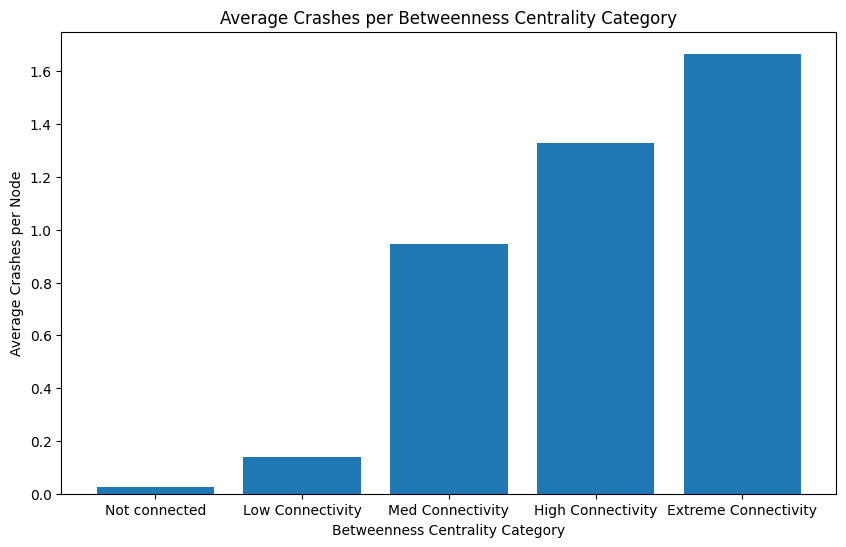

In [16]:
#Code to plot a bar Chart of Average crashes per betweenness centrality category

plt.figure(figsize=(10, 6))
plt.bar(Connectivity_Crash_df["bc_category"], Connectivity_Crash_df["Average_no_crash_per_node"])
plt.xlabel('Betweenness Centrality Category')
plt.ylabel('Average Crashes per Node')
plt.title('Average Crashes per Betweenness Centrality Category')

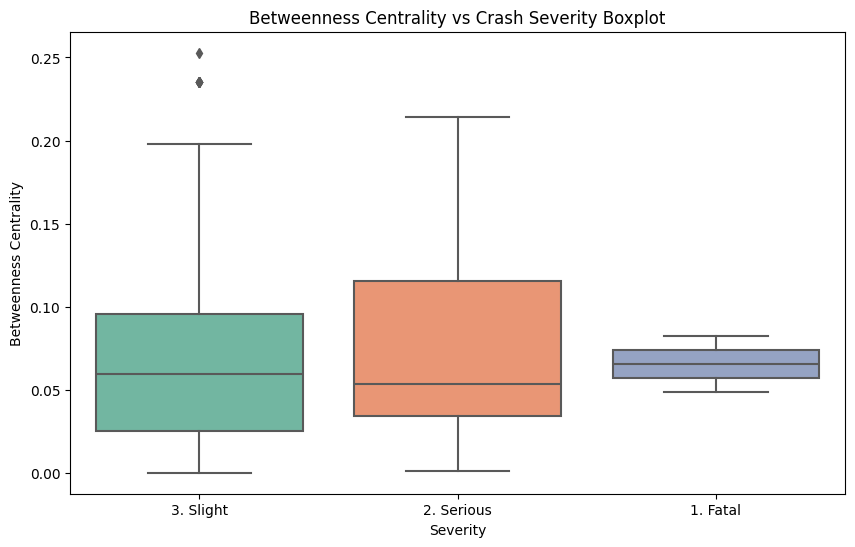

In [17]:
# Box and whisker plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='Severity', y='bc', data=crashes_w_buffer, palette='Set2')
plt.title('Betweenness Centrality vs Crash Severity Boxplot')
plt.xlabel('Severity')
plt.ylabel('Betweenness Centrality')
plt.show()

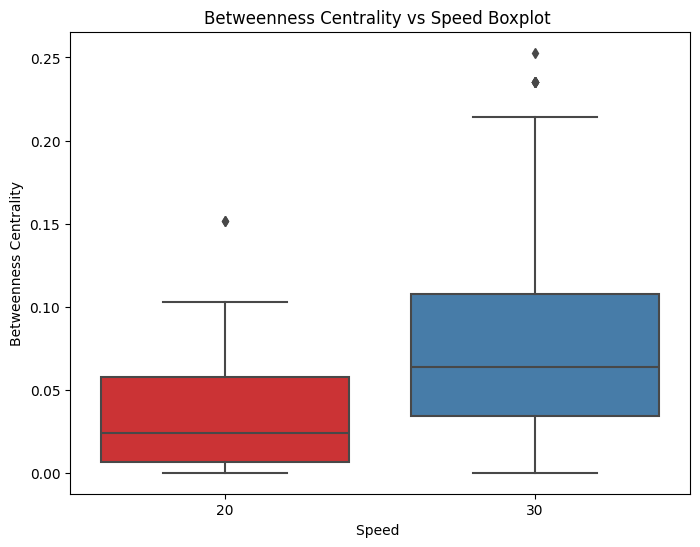

In [18]:
# Box and whisker plot - subset only 20mph and 30mph
speed_subset = crashes_w_buffer[(crashes_w_buffer['Speed_Lim'] == 20 ) | (crashes_w_buffer['Speed_Lim'] == 30)]
speed_subset

plt.figure(figsize=(8, 6))
sns.boxplot(x='Speed_Lim', y='bc', data=speed_subset, palette='Set1')
plt.title('Betweenness Centrality vs Speed Boxplot ')
plt.xlabel('Speed ')
plt.ylabel('Betweenness Centrality')
plt.show()

Is there a correlation between road network connectivity and crashes?

Firstly, the explore map shows that there is clearly a large difference in the network connectivity of Cambridge. There is one road that runs from North to South that contains most of the nodes which are in the highest betweenness centrality categories. This map, combined with the bar chart below is significant in showing the problem of road network connectivity in Cambridge. 

The bar chart clearly shows that there is a positive correlation between high betweenness centrality measures and the number of crashes that take place. As betweenness centrality, and therefore connectivity increases, the number of predicted crashes taking place at each node increases. Nodes with an extremely high betweenness centrality (in this case more than 0.2) can expect to see an average of 1.6 crashes per node. Whereas nodes which are not connected at all or have low connectivity (less than 0.05) can expect to see far fewer crashes at each node. This helps to answer the first research question, which was aimed at determining if there is a correlation between road network connectivity and crashes. 

There is an argument that this result is somewhat self explanatory since areas of high betweenness centrality are likely to have more vehicles travelling on those roads, since they are part of the fastest route networks between different place. There is however, significance to these results. The explore map, clearly shows that there are only a few roads in the whole network that have a high betweenness centrality, and therefore are areas of high connectivity. The result of this is that daily, there will be a high volume of vehicles going through these few streets, leading to more crashes overall. This presents an issue with the general connectivity of Cambridge’s street network. Therefore, there need to be other routes that can bypass the areas where there is high betweenness centrality. This will offer vehicles an alternative route. The decreased congestion and concentration of high betweenness centrality nodes will hopefully reduce the number of crashes that take place throughout Cambridge. This is because the overall betweenness centrality values will be lower in a better connected city, therefore there will be a reduced crashes as on average, there are less crashes within nodes that have a lower connectivity.

This project also hoped to determine whether there are more severe car accidents that take place in areas of high betweenness centrality. This is an important statistic to know, since if there were more severe crashes at high betweenness centralities, then it would suggest an even greater need for street network changes. There were very few fatal collisions, so the main focus of the box plot was on the “slight” and “serious” severity categories. The box and whisker plot shows that there is little difference between the distribution of betweenness centrality measures and crash severity between these two categories due to the very similar medians, interquartile ranges and ranges. 

This project also determined if there are different speed limits at different betweenness centralities. The boxplots suggest that there speed limits of 20mph are often associated with low betweenness centrality measures, however speed limits of 30mph are associated with much higher betweenness centralities. This is shown by the higher median of the 30mph boxplot, and the much higher upper limits of both the range and interquartile range. This is significant as lower speed limits in areas where there is lots of car flow may reduce the possibility of crashes taking place. 





### Determining the success of cycle lanes

The following results show the: 

* Locations of where bikes were hit and whether they were in a bike lane or not
* The total counts and percentages of cyclists hit in bike lanes vs not in a bike lane
* Severity difference of crashes in bike lanes
* The location of crash difference between bike lane or not

In [19]:
bike_crash.explore('Inside_Cycle_Lane', cmap='Dark2', tiles="cartodbpositron")

In [20]:
#Get counts and percentage of crashes in and out of cyclelanes
cyclelane_counts = bike_crash['Inside_Cycle_Lane'].value_counts()
cyclelane_percentage = bike_crash['Inside_Cycle_Lane'].value_counts(normalize=True)*100

#make a dataframe 
counts_df = pd.DataFrame({'In Cyle Lane':cyclelane_counts.index, 'Count':cyclelane_counts.values, 'Percentage':cyclelane_percentage.values})
counts_df

,In Cyle Lane,Count,Percentage
0,False,243,63.446475
1,True,140,36.553525


<Figure size 800x600 with 0 Axes>

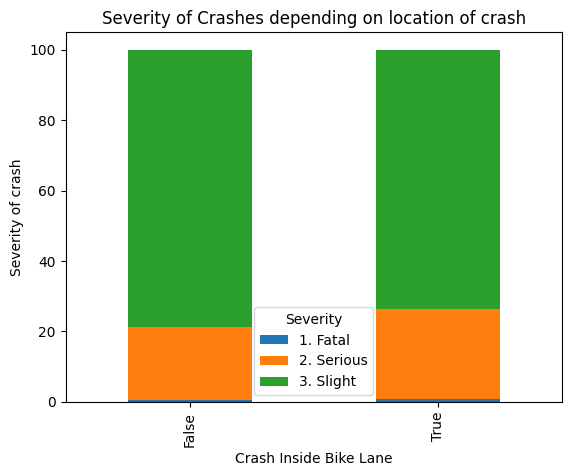

In [21]:
cross_tab = pd.crosstab(bike_crash['Severity'], bike_crash['Inside_Cycle_Lane'])

cross_tab_perc = cross_tab.copy()
cross_tab_perc.iloc[:, :1]= (cross_tab.iloc[:, :1] / 243)*100
cross_tab_perc.iloc[:, 1:2] = (cross_tab.iloc[:, 1:2] / 140)*100

severity_bar = cross_tab_perc.T

plt.figure(figsize=(8, 6))
severity_bar.plot(kind='bar', stacked=True)
 
plt.xlabel('Crash Inside Bike Lane')
plt.ylabel('Severity of crash')
 
# title of plot
plt.title('Severity of Crashes depending on location of crash')
plt.show()

In [22]:
junct_true = bike_crash[bike_crash['Inside_Cycle_Lane'] == True]['Junct_det'].value_counts(normalize=True)*100
junct_true

Junct_det
3. T & Stag Jct                                      32.857143
1. Roundabout                                        27.142857
0. Not within 20m of junction                        19.285714
2. Mini roundabout                                    7.857143
6. Crossroads                                         5.000000
8. Pri Drive                                          4.285714
9. Other                                              2.142857
5. Slip Road                                          0.714286
7. Junction - more than 4 arms (not a roundabout)     0.714286
Name: proportion, dtype: float64

In [23]:
junct_false = bike_crash[bike_crash['Inside_Cycle_Lane'] == False]['Junct_det'].value_counts(normalize=True)*100
junct_false

Junct_det
3. T & Stag Jct                                      41.152263
0. Not within 20m of junction                        30.041152
1. Roundabout                                        13.991770
6. Crossroads                                         7.818930
8. Pri Drive                                          3.703704
2. Mini roundabout                                    1.646091
9. Other                                              1.234568
7. Junction - more than 4 arms (not a roundabout)     0.411523
Name: proportion, dtype: float64

To what extent are cycle lanes successful at reducing the number of car-bike accidents?

The explore map, shows that there are various different locations where there has been an accident between a car and a bike that took place. Although it seems as there are areas of cycle lanes which show a lot of car-bike accidents. For example, there is a road to the south of Cambridge that shows a large number of car-bike accidents that took place in cycle lanes. The explore map is important in this analysis because it gives a background to the nature of car-bike accidents. That is, it seems as though there are more accidents that happen out of cycle lanes, although there are still quite a few car-bike accidents that take place even though cycle lanes are present in some areas. 

The next dataframe shows that there are differences in the numbers of car-bike accidents that take place within, and outside cycle lanes. 243(63%) of car-bike collisions take place outside of cycle lanes, compared to 140(37%) collisions that take place within the cycle lanes. This is important to note as although there are less accidents that take place in the cycle lanes, there is still quite a significant number of accidents that happen in cycle lanes, over one third of bike accidents take place in the cycle lanes. This gives part of an answer to the second research question. There is some success, given that less crashes take place in cycle lanes, but there is a significant proportion of crashes still happening in these areas. 

The stacked bar chart compares the severity of accidents that take place within, and outside bike lanes. The bar chart shows that there is no significant differences in the severity of crashes between the two. This shows an area that bike lanes could be more successful in. 

Finally, the last two cells make two arrays, showing where the crash happened. In both cases, the main locations that accidents happened were at a T Junction, a roundabout or an area of straight road. The difference between the two, is that most of the accidents in cycle lanes happen at T Junctions (33%) or roundabouts (27%). These are the cases when the cyclist may be moving across the road to make a turn or going on a roundabout, where there are no marked cycle lanes. In the context of crashes that take place outside of cycle lanes, most accidents happen on the T Junctions (40%) or on a straight (30%). This shows that cycle lanes do a good job of reducing collisions not on straight roads. However there is clearly much improvement needed for T Junctions. 


### Do deprivation levels or access to vehicles effect the number of accidents?

In [24]:
cambs_IMD.explore('IMD_rank')

In [25]:
cambs_IMD.explore("crashes_per_LSOA", cmap="cividis", tiles="cartodbpositron")

In [26]:
crashes_per_IMD

,IMD_rank,crashes_per_IMD
0,2,10.000000
1,3,5.400000
2,4,11.000000
3,5,7.384615
4,6,15.285714
5,7,9.375000
6,8,12.700000
7,9,11.000000
8,10,5.125000


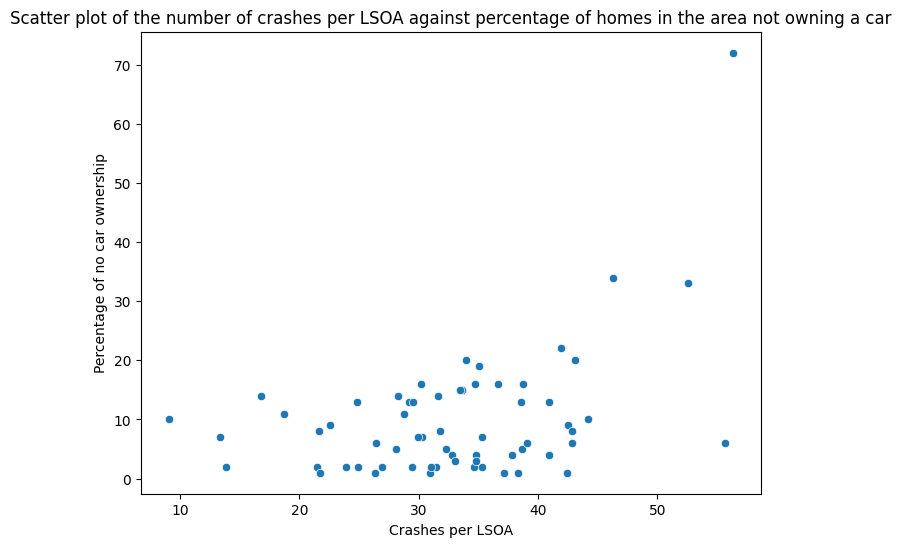

In [27]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=cambs_IMD_car, x='no_car_perc', y='crashes_per_LSOA')
plt.xlabel('Crashes per LSOA')
plt.ylabel('Percentage of no car ownership')
 
# title of plot
plt.title('Scatter plot of the number of crashes per LSOA against percentage of homes in the area not owning a car')
plt.show()

In [28]:
cambs_IMD_car['crashes_per_LSOA'].corr(cambs_IMD_car['no_car_perc'])

0.4206626456109249

In [33]:
cambs_IMD_car.explore('no_car_perc')

Does deprivation or access to a vehicle effect the number of car accidents?

The first explore map shows the spatial variation in the IMD across Cambridge. It shows that the more deprived LSOAs of Cambridge are in the north and north-east of the city (shown in purples and blues), whereas the less deprived LSOAs are in the south and south-west of the city. 

However, the counts of crashes per LSOA in Cambridge does not follow this pattern. There are a large number of crashes that take place in the centre of Cambridge, however other than that the counts are sporadic, shown by the values and greys being mixed up amongst the LSOAs. This is supported by the dataframe, which is a calculation of the mean number of crashes per each IMD value. There is no clear pattern as to whether there is different numbers of crashes in more or less deprived areas of Cambridge. Therefore, from this data, deprivation has no significant effect on the number of car accidents in the area. 

A scatterplot was made to plot the number of crashes in each LSOA against the percentage of households in that LSOA not owning a car. From the plot, it seems as though there is a very small positive relationship. A Pearson’s correlation coefficient was calculated which suggested that there was a very small positive correlation of 0.42. Therefore there was a LSOAs with higher percentages of people who did not own a car, were more likely to see higher numbers of accidents. 

The final explore map shows that the LSOAs which had high percentages of people not owning a car were those in the centre of town. The folium heatmap showed that there were plenty of crashes that took place in the centre of town. Therefore this is likely to be why there is a positive relationship between not owning a car and the number of crashes in each LSOA. 


## Discussion

Interpret your results in the context of existing literature. Discuss any limitations of your study and potential future research directions.


## Conclusion

Summarize the key findings and their implications. Briefly restate the research question and highlight the main contributions of your project.


## Appendix

Include any additional information and code not included in the main body of the paper but may be necessary. This could include:

* Raw data tables
* Additional figures or tables
* Supporting code


**Information about the city_crash dataframe**

In [40]:
city_crash.head()

,Date,Police_ref,Easting,Northing,Severity,Casualties,Pedestrian,Cycles,Road_Type,Speed_Lim,Junct_det,Weather,Day,Local_Auth,geometry
3,20180103,18257077,546231,257858,3. Slight,1,0,0,6. Single carriageway,20,6. Crossroads,1. Fine without high winds,4. Wednesday,E07000008,POINT (546231.000 257858.000)
9,20180104,18256231,546238,257859,3. Slight,1,0,1,6. Single carriageway,30,6. Crossroads,2. Raining without high winds,5. Thursday,E07000008,POINT (546238.000 257859.000)
11,20180105,18257015,545200,258267,3. Slight,1,1,0,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,6. Friday,E07000008,POINT (545200.000 258267.000)
12,20180105,18259273,544638,259600,3. Slight,1,0,0,6. Single carriageway,20,6. Crossroads,1. Fine without high winds,6. Friday,E07000008,POINT (544638.000 259600.000)
13,20180105,18259870,546395,261212,3. Slight,1,0,1,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,6. Friday,E07000008,POINT (546395.000 261212.000)


**Information about the bike_crash dataframe**

In [38]:
bike_crash.head()

,Date,Police_ref,Easting,Northing,Severity,Casualties,Pedestrian,Cycles,Road_Type,Speed_Lim,Junct_det,Weather,Day,Local_Auth,geometry,Inside_Cycle_Lane
9,20180104,18256231,546238,257859,3. Slight,1,0,1,6. Single carriageway,30,6. Crossroads,2. Raining without high winds,5. Thursday,E07000008,POINT (546238.000 257859.000),True
13,20180105,18259870,546395,261212,3. Slight,1,0,1,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,6. Friday,E07000008,POINT (546395.000 261212.000),False
18,20180106,18258382,546422,257021,3. Slight,1,0,1,6. Single carriageway,30,0. Not within 20m of junction,1. Fine without high winds,7. Saturday,E07000008,POINT (546422.000 257021.000),False
19,20180107,18256894,547601,258012,2. Serious,1,0,1,1. Roundabout,30,1. Roundabout,1. Fine without high winds,1. Sunday,E07000008,POINT (547601.000 258012.000),False
35,20180109,18257452,546461,257215,3. Slight,1,0,1,1. Roundabout,30,2. Mini roundabout,1. Fine without high winds,3. Tuesday,E07000008,POINT (546461.000 257215.000),False


**A map of the cycle lanes in Cambridge**

In [37]:
cycle_path.explore()

## References

You could use an appropriate citation management tool (e.g., Zotero, Mendeley) to create BibTeX entries for your references. Paste the generated BibTeX code here, and you can use tools like `pandoc` (if necessary) to convert it to the desired reference format (e.g., APA, MLA).
